# TP02 : Feature Extraction and embeddings

## For text cleaning i have:
    -removed punctuation
    -removed emails,html tags and urls
    -lowered the case
    -removed duplicates
    -fixed accented chars
    -removed stopwords
## For the tokenization:
    - i have used the subword tokenization -- > ### SentencePiece 
## For Stemming:
    - i used  ### snowball 

## 1-Data Preparation:

### - Preprocessed dataset import

In [1]:
import pandas as pd
df = pd.read_csv('spooky_preprocessed.csv')
df.head(10)

,text,author
0,"['▁process', '▁how', 'ev', '▁afford', '▁mean',...",EAP
1,"['▁love', '▁spring', '▁look', '▁winds', 'or', ...",MWS
2,"['▁find', '▁not', 'h', '▁', 'el', 's', '▁even'...",HPL
3,"['▁youth', '▁pass', '▁so', 'lit', 'ud', '▁best...",MWS
4,"['▁astronom', '▁per', 'h', 'ap', '▁point', '▁t...",EAP
5,"['▁s', 'ur', 'c', 'ing', 'l', '▁hung', '▁ri', ...",EAP
6,"['▁knew', '▁could▁say', '▁st', 'ere', 'ot', 'o...",EAP
7,"['▁confess', '▁neither', '▁str', 'u', 'ct', 'u...",MWS
8,"['▁shall', '▁find', '▁feel', '▁in', 'j', 'uri'...",MWS
9,"['▁barricad', '▁present', '▁secur']",EAP


## 2- Encoding of the Target Variable (one hot encoding)

In [2]:
df['author'].unique()

array(['EAP', 'MWS', 'HPL'], dtype=object)

In [3]:
X=df.drop(['author'],axis='columns')
X.head()

,text
0,"['▁process', '▁how', 'ev', '▁afford', '▁mean',..."
1,"['▁love', '▁spring', '▁look', '▁winds', 'or', ..."
2,"['▁find', '▁not', 'h', '▁', 'el', 's', '▁even'..."
3,"['▁youth', '▁pass', '▁so', 'lit', 'ud', '▁best..."
4,"['▁astronom', '▁per', 'h', 'ap', '▁point', '▁t..."


In [4]:

y=df.drop(['text'],axis='columns')
y.head()

,author
0,EAP
1,MWS
2,HPL
3,MWS
4,EAP


In [5]:
y = pd.get_dummies(y, columns=['author'])

In [6]:
y

,author_EAP,author_HPL,author_MWS
0,1,0,0
1,0,0,1
2,0,1,0
3,0,0,1
4,1,0,0
...,...,...,...
19572,1,0,0
19573,1,0,0
19574,1,0,0
19575,1,0,0


In [7]:

y= y.rename(columns={'author_EAP': 'EAP', 'author_HPL': 'HPL','author_MWS':'MWS'})

In [8]:
y.head()

,EAP,HPL,MWS
0,1,0,0
1,0,0,1
2,0,1,0
3,0,0,1
4,1,0,0


## 3- Construction of Training and Testing Sets

### Split the dataset 

In [9]:
import numpy as np
from sklearn.model_selection import train_test_split

/home/chaima/.local/lib/python3.10/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Data Distribution Without stratify

In [10]:
from sklearn.model_selection import train_test_split
X_train_nostratify, X_test_nostratify, y_train_nostratify, y_test_nostratify = train_test_split(X, y, test_size=0.3, random_state=0)

In [11]:
y_train_nostratify.head()

,EAP,HPL,MWS
7006,0,0,1
665,1,0,0
15909,0,0,1
16274,0,0,1
1646,1,0,0


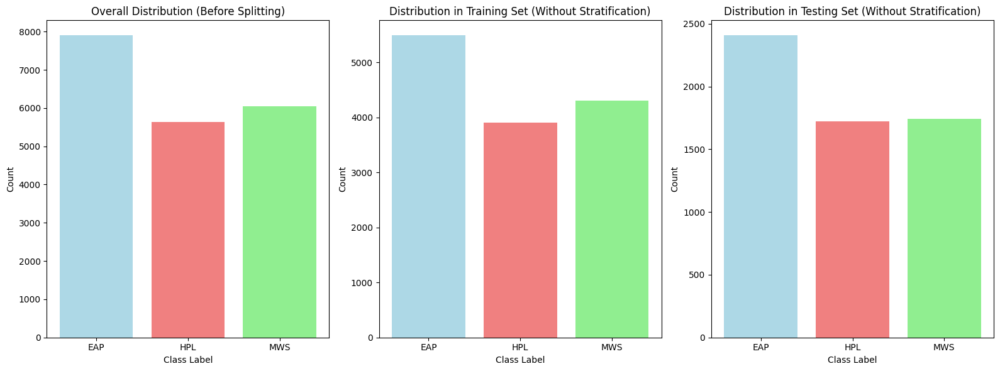

In [12]:
import matplotlib.pyplot  as plt 
plt.figure(figsize=(16, 6))

plt.subplot(1, 3, 1)
plt.bar(y.sum().index, y.sum().values,color=['lightblue', 'lightcoral', 'lightgreen'])
plt.title('Overall Distribution (Before Splitting)')
plt.xlabel('Class Label')
plt.ylabel('Count')

plt.subplot(1, 3, 2)
plt.bar(y_train_nostratify.sum().index, y_train_nostratify.sum().values,color=['lightblue', 'lightcoral', 'lightgreen'])
plt.title('Distribution in Training Set (Without Stratification)')
plt.xlabel('Class Label')
plt.ylabel('Count')

plt.subplot(1, 3, 3)
plt.bar(y_test_nostratify.sum().index, y_test_nostratify.sum().values,color=['lightblue', 'lightcoral', 'lightgreen'])
plt.title('Distribution in Testing Set (Without Stratification)')
plt.xlabel('Class Label')
plt.ylabel('Count')

plt.tight_layout()
plt.show()


## Split with stratify

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0,stratify=y)

In [14]:
print('X shape:', X.shape)
print('X train shape:', X_train.shape)
print('X test shape:', X_test.shape)
print('Y shape:', y.shape)
print('Y train shape:', y_train.shape)
print('Y test shape:', y_test.shape)



X shape: (19577, 1)
X train shape: (13703, 1)
X test shape: (5874, 1)
Y shape: (19577, 3)
Y train shape: (13703, 3)
Y test shape: (5874, 3)


In [15]:
# Display a sample of the training set
print("Training Set:")
print(pd.concat([X_train, y_train], axis=1).head())

# Display a sample of the testing set
print("\nTesting Set:")
print(pd.concat([X_test, y_test], axis=1).head())

Training Set:
                                                    text  EAP  HPL  MWS
13937  ['▁m', 'id', 'd', 'l', '▁extent', '▁depress', ...    1    0    0
13237  ['▁right', '▁much', '▁', 'ing', 'en', 'u', '▁f...    1    0    0
7638   ['▁hencefor', 'ward', '▁haunt', '▁tomb', '▁nig...    0    1    0
16846  ['▁also', '▁rose', '▁stood', '▁motionless', '▁...    0    1    0
3280   ['▁as', 's', 'um', '▁crypt', 'ograph', '▁en', ...    1    0    0

Testing Set:
                                                    text  EAP  HPL  MWS
17322  ['▁incu', 'rs', '▁struck', '▁en', 'gl', 'ish',...    0    0    1
3571   ['▁guess', '▁he', 's', '▁say', 'in', '▁spell',...    0    1    0
3427        ['▁hand', '▁en', 'or', 'm', '▁', 'lar', 'g']    1    0    0
1882   ['▁still', '▁spectral', '▁str', 'ang', '▁f', '...    0    1    0
5157   ['▁kind', '▁banish', '▁expe', 'ri', 'en', 'c',...    0    0    1


## Data distribution after stratify

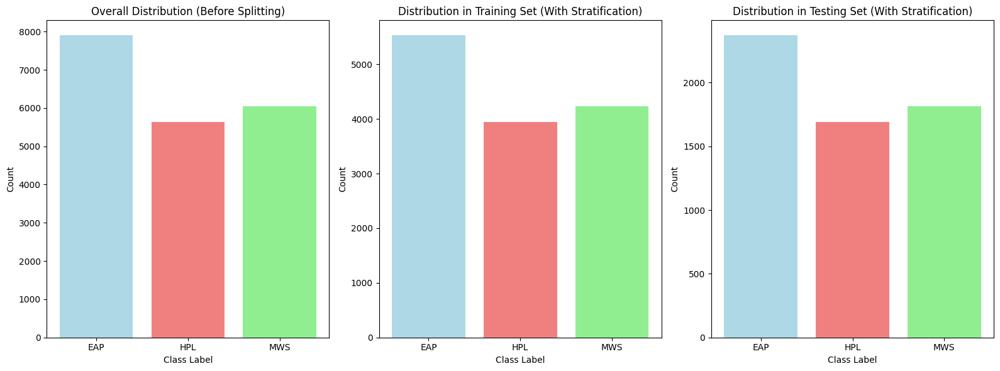

In [16]:
plt.figure(figsize=(16, 6))
plt.subplot(1, 3, 1)
plt.bar(y.sum().index, y.sum().values,color=['lightblue', 'lightcoral', 'lightgreen'])
plt.title('Overall Distribution (Before Splitting)')
plt.xlabel('Class Label')
plt.ylabel('Count')

plt.subplot(1, 3, 2)
plt.bar(y_train.sum().index, y_train.sum().values,color=['lightblue', 'lightcoral', 'lightgreen'])
plt.title('Distribution in Training Set (With Stratification)')
plt.xlabel('Class Label')
plt.ylabel('Count')

plt.subplot(1, 3, 3)
plt.bar(y_test.sum().index, y_test.sum().values,color=['lightblue', 'lightcoral', 'lightgreen'])
plt.title('Distribution in Testing Set (With Stratification)')
plt.xlabel('Class Label')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

## 4-Vectorization Methods

###  CountVectorizer

In [17]:
from sklearn.feature_extraction.text import CountVectorizer
coun_vect = CountVectorizer()
x_train_count = coun_vect.fit_transform(X_train['text'])
x_train_count_array = x_train_count.toarray()
x_train_countvec = pd.DataFrame(data=x_train_count_array,columns = coun_vect.get_feature_names())


/home/chaima/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [18]:
x_train_countvec.head()

,ab,abandon,abaout,abbey,abel,abhor,abroad,abrupt,absent,abstain,...,youth,ypno,yxu,ze,zeal,zee,zenith,zest,zit,zone
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [19]:
x_test_count = coun_vect.transform(X_test['text'])
x_test_count_array = x_test_count.toarray()
x_test_countvec = pd.DataFrame(data=x_test_count_array,columns = coun_vect.get_feature_names())

/home/chaima/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [20]:
x_test_countvec.head()

,ab,abandon,abaout,abbey,abel,abhor,abroad,abrupt,absent,abstain,...,youth,ypno,yxu,ze,zeal,zee,zenith,zest,zit,zone
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
row_sums = x_train_countvec.sum(axis=1)
print(row_sums)

0         9
1        21
2        11
3        15
4         7
         ..
13698     7
13699    14
13700    15
13701     8
13702    16
Length: 13703, dtype: int64


### one-hot encoding

In [22]:
from sklearn.preprocessing import MultiLabelBinarizer
from ast import literal_eval
x_train_text = [literal_eval(tokens) for tokens in X_train['text']]
x_test_text = [literal_eval(tokens) for tokens in X_test['text']]

# Create MultiLabelBinarizer
one_hot_encoder = MultiLabelBinarizer()

# Fit and transform the training set
x_train_one_hot = one_hot_encoder.fit_transform(x_train_text)

# Transform the testing set
x_test_one_hot = one_hot_encoder.transform(x_test_text)

# Convert the resulting matrices to DataFrames
x_train_one_hot_df = pd.DataFrame(x_train_one_hot, columns=one_hot_encoder.classes_)
x_test_one_hot_df = pd.DataFrame(x_test_one_hot, columns=one_hot_encoder.classes_)



/home/chaima/.local/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:878: UserWarning: unknown class(es) ['anic', 'ankind', 'arge', 'atic', 'coffin', 'cur▁to', 'cuttle', 'drift', 'ears', 'ed▁away', 'ed▁for', 'erpetua', 'e▁est', 'gentleman', 'ges', 'great▁silver▁key', 'ha▁nthlei', 'hoot', 'ical', 'inous', 'iolet', 'lone', 'l▁pover', 'onsequent', 'or▁purchas', 'other', 'proach', 'pugna', 'scape', 'stream', 'st▁quia▁i', 's▁dilator', 'th▁birthday', 'tumble', 't▁one▁period', 'urney', 'use', 'utilitarian', 'volution', 'ware', 'xtinguish', '▁abreast', '▁adamant', '▁afore', '▁almost▁to', '▁almost▁too', '▁amidst▁a', '▁amid▁a', '▁angelic', '▁angle', '▁apprentice', '▁back▁to', '▁black▁doorway', '▁blossom▁o', '▁bracelet', '▁buffet', '▁calmest▁weather', '▁came▁out', '▁canvas', '▁carry', '▁catalpa', '▁catechis', '▁cause', '▁che▁non▁se', '▁choice', '▁clappe', '▁cliffs', '▁comes', '▁congregat', '▁copy', '▁could▁not', '▁coup▁d', '▁decipher', '▁direction', '▁double', '▁drew▁a', '▁ease', '▁ea

In [23]:
x_train_one_hot_df.head()

,a,ab,abel,ac,ace,ach,acit,ack,actic,action,...,▁youth,▁yxu,▁yxu▁knxw,▁z,▁zeal,▁zee,▁zenith,▁zest,▁zit▁still,▁zone
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
x_test_one_hot_df.head()

,a,ab,abel,ac,ace,ach,acit,ack,actic,action,...,▁youth,▁yxu,▁yxu▁knxw,▁z,▁zeal,▁zee,▁zenith,▁zest,▁zit▁still,▁zone
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
row_sums = x_train_one_hot_df.sum(axis=1)
print(row_sums)

0        12
1        26
2        11
3        17
4         8
         ..
13698     8
13699    17
13700    17
13701    10
13702    21
Length: 13703, dtype: int64


### TF-IDF

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
x_train_tfidf = tfidf.fit_transform(X_train['text'])
x_test_tfidf = tfidf.transform(X_test['text'])


In [27]:
# Convert sparse matrices to DataFrames
columns = tfidf.get_feature_names_out()

df_train_tfidf = pd.DataFrame(x_train_tfidf.toarray(), columns=columns)
df_test_tfidf = pd.DataFrame(x_test_tfidf.toarray(), columns=columns)

In [28]:
df_train_tfidf.head()

,ab,abandon,abaout,abbey,abel,abhor,abroad,abrupt,absent,abstain,...,youth,ypno,yxu,ze,zeal,zee,zenith,zest,zit,zone
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [29]:
df_test_tfidf.head()

,ab,abandon,abaout,abbey,abel,abhor,abroad,abrupt,absent,abstain,...,youth,ypno,yxu,ze,zeal,zee,zenith,zest,zit,zone
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [30]:
row_sums =df_train_tfidf.sum(axis=1)
print(row_sums)

0        2.869315
1        3.995586
2        3.226980
3        3.756349
4        2.530195
           ...   
13698    2.510251
13699    3.659810
13700    3.775710
13701    2.747212
13702    3.936945
Length: 13703, dtype: float64


In [31]:
row_sums =df_test_tfidf.sum(axis=1)
print(row_sums)

0       4.010421
1       3.479630
2       1.967797
3       4.446297
4       2.534422
          ...   
5869    2.592387
5870    4.736836
5871    4.511915
5872    2.911949
5873    2.598405
Length: 5874, dtype: float64


## 5-Training:

### Creation of 3 MLP classifiers with 1 hidden layer,relu activation function, adam optimizer

In [1]:
#Importing MLPClassifier
from sklearn.neural_network import MLPClassifier

#Initializing the MLPClassifier
freq_classifier = MLPClassifier(hidden_layer_sizes=(50), max_iter=300,activation = 'relu',solver='adam',random_state=0)
onehot_classifier = MLPClassifier(hidden_layer_sizes=(50), max_iter=300,activation = 'relu',solver='adam',random_state=0)
tfidf_classifier = MLPClassifier(hidden_layer_sizes=(50), max_iter=300,activation = 'relu',solver='adam',random_state=0)


### Fitting the training data to the network

In [ ]:
tfidf_classifier = MLPClassifier(hidden_layer_sizes=(50),
                                  max_iter=300,activation = 'relu',
                                  solver='adam',
                                  random_state=0)


In [6]:
tfidf_classifier

MLPClassifier(hidden_layer_sizes=50, max_iter=300, random_state=0)

#### frequency classifier

In [33]:
import time
start_time = time.time()
freq_classifier.fit(x_train_count, y_train)
end_time=time.time()
freq_training_time=end_time - start_time

#### onehot classifier

In [34]:
start_time = time.time()
onehot_classifier.fit(x_train_one_hot, y_train)
end_time = time.time()
onehot_training_time = end_time - start_time

#### tfidf classifier

In [35]:
start_time = time.time()
tfidf_classifier.fit(x_train_tfidf, y_train)
end_time = time.time()
tfidf_training_time = end_time - start_time

### Predicting on the training set

In [36]:

y_pred_freq = freq_classifier.predict(x_train_count)

y_pred_onehot = onehot_classifier.predict(x_train_one_hot)
y_pred_tfidf = tfidf_classifier.predict(x_train_tfidf)

### Classification report

In [37]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
# Set zero_division=1 to avoid UndefinedMetricWarning
zero_division_param = 1

# Classification report for frequency-based representation
report_freq = classification_report(y_train, y_pred_freq, zero_division=zero_division_param)
print("Classification Report for Frequency-based Representation:\n", report_freq)
accuracy_freq_train= accuracy_score(y_train, y_pred_freq)
print("training Accuracy for frequency Representation:", accuracy_freq_train)


Classification Report for Frequency-based Representation:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5529
           1       1.00      1.00      1.00      3944
           2       1.00      1.00      1.00      4230

   micro avg       1.00      1.00      1.00     13703
   macro avg       1.00      1.00      1.00     13703
weighted avg       1.00      1.00      1.00     13703
 samples avg       1.00      1.00      1.00     13703

training Accuracy for frequency Representation: 0.9995621396774429


In [38]:
# Classification report for one-hot encoded representation
report_onehot = classification_report(y_train, y_pred_onehot, zero_division=zero_division_param)
print("\nClassification Report for One-hot Encoded Representation:\n", report_onehot)
accuracy_onehot_train= accuracy_score(y_train, y_pred_onehot)
print("training Accuracy for one hot Representation:", accuracy_onehot_train)


Classification Report for One-hot Encoded Representation:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5529
           1       1.00      1.00      1.00      3944
           2       1.00      1.00      1.00      4230

   micro avg       1.00      1.00      1.00     13703
   macro avg       1.00      1.00      1.00     13703
weighted avg       1.00      1.00      1.00     13703
 samples avg       1.00      1.00      1.00     13703

training Accuracy for one hot Representation: 0.9994891629570167


In [39]:
# Classification report for TF-IDF representation
report_tfidf = classification_report(y_train, y_pred_tfidf, zero_division=zero_division_param)
print("\nClassification Report for TF-IDF Representation:\n", report_tfidf)
accuracy_tfidf_train= accuracy_score(y_train, y_pred_tfidf)
print("training Accuracy for TF-IDF Representation:", accuracy_tfidf_train)


Classification Report for TF-IDF Representation:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5529
           1       1.00      1.00      1.00      3944
           2       1.00      1.00      1.00      4230

   micro avg       1.00      1.00      1.00     13703
   macro avg       1.00      1.00      1.00     13703
weighted avg       1.00      1.00      1.00     13703
 samples avg       1.00      1.00      1.00     13703

training Accuracy for TF-IDF Representation: 0.9995621396774429


## 6- Testing

### Predicting on the test set

In [40]:
y_pred_freq_test = freq_classifier.predict(x_test_count)
y_pred_onehot_test = onehot_classifier.predict(x_test_one_hot)
y_pred_tfidf_test = tfidf_classifier.predict(x_test_tfidf)

### Classification report

In [41]:
from sklearn.metrics import accuracy_score
report_freq_test = classification_report(y_test, y_pred_freq_test, zero_division=zero_division_param)
print("Classification Report for Frequency-based Representation:\n", report_freq_test)
accuracy_freq = accuracy_score(y_test, y_pred_freq_test)
print("Accuracy for Frequency-based Representation:", accuracy_freq)


Classification Report for Frequency-based Representation:
               precision    recall  f1-score   support

           0       0.73      0.73      0.73      2370
           1       0.74      0.71      0.72      1690
           2       0.70      0.71      0.71      1814

   micro avg       0.72      0.72      0.72      5874
   macro avg       0.72      0.72      0.72      5874
weighted avg       0.72      0.72      0.72      5874
 samples avg       0.76      0.72      0.70      5874

Accuracy for Frequency-based Representation: 0.6678583588695948


In [42]:
report_onehot_test = classification_report(y_test, y_pred_onehot_test, zero_division=zero_division_param)
print("\nClassification Report for One-hot Encoded Representation:\n", report_onehot_test)
accuracy_onehot = accuracy_score(y_test, y_pred_onehot_test)
print("Accuracy for One-hot Encoded Representation:", accuracy_onehot)


Classification Report for One-hot Encoded Representation:
               precision    recall  f1-score   support

           0       0.74      0.74      0.74      2370
           1       0.74      0.70      0.72      1690
           2       0.70      0.71      0.71      1814

   micro avg       0.73      0.72      0.72      5874
   macro avg       0.73      0.72      0.72      5874
weighted avg       0.73      0.72      0.72      5874
 samples avg       0.76      0.72      0.70      5874

Accuracy for One-hot Encoded Representation: 0.6704119850187266


In [43]:
report_tfidf_test = classification_report(y_test, y_pred_tfidf_test, zero_division=zero_division_param)
print("\nClassification Report for TF-IDF Representation:\n", report_tfidf_test)
accuracy_tfidf = accuracy_score(y_test, y_pred_tfidf_test)
print("Accuracy for TF-IDF Representation:", accuracy_tfidf)


Classification Report for TF-IDF Representation:
               precision    recall  f1-score   support

           0       0.73      0.71      0.72      2370
           1       0.73      0.70      0.71      1690
           2       0.69      0.70      0.69      1814

   micro avg       0.71      0.70      0.71      5874
   macro avg       0.71      0.70      0.71      5874
weighted avg       0.71      0.70      0.71      5874
 samples avg       0.74      0.70      0.69      5874

Accuracy for TF-IDF Representation: 0.665645216207014


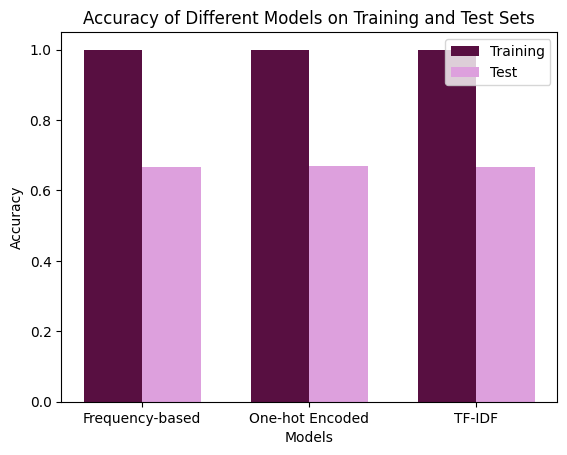

In [44]:
accuracies_training = [accuracy_freq_train, accuracy_onehot_train, accuracy_tfidf_train]
accuracies_test= [accuracy_freq,accuracy_onehot,accuracy_tfidf]
models = ['Frequency-based', 'One-hot Encoded', 'TF-IDF']



bar_width = 0.35

indices_training = np.arange(len(models))
indices_test = indices_training + bar_width

plt.bar(indices_training, accuracies_training, width=bar_width, label='Training', color='#580F41')
plt.bar(indices_test, accuracies_test, width=bar_width, label='Test', color= '#DDA0DD')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy of Different Models on Training and Test Sets')
plt.xticks(indices_training + bar_width / 2, models)
plt.legend()

plt.show()


### Calculating the trainig timee for each model

In [45]:
print(f"Training time for the frequency  based model: {freq_training_time} seconds")
print(f"Training time for the one hot encoding based model: {onehot_training_time} seconds")
print(f"Training time for the tfidf based model: {tfidf_training_time} seconds")

Training time for the frequency  based model: 137.30036091804504 seconds
Training time for the one hot encoding based model: 297.4100275039673 seconds
Training time for the tfidf based model: 206.07210993766785 seconds


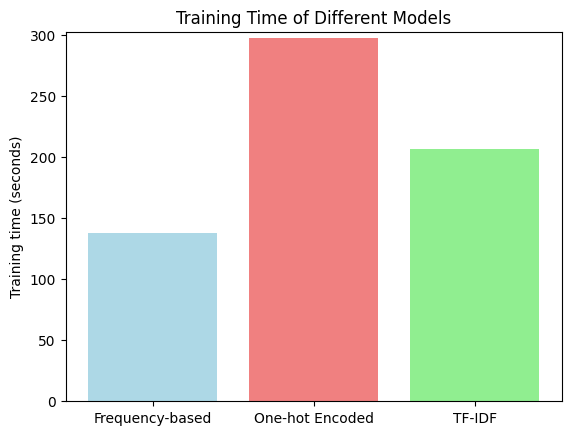

In [46]:
training_time = [freq_training_time, onehot_training_time, tfidf_training_time]
models = ['Frequency-based', 'One-hot Encoded', 'TF-IDF']

plt.bar(models, training_time, color=['lightblue', 'lightcoral', 'lightgreen'])
plt.ylabel('Training time (seconds)')
plt.title('Training Time of Different Models')
plt.ylim(0, max(training_time) + 5)  # Adjust the y-axis limit based on your data
plt.show()


## 7- Vectorizations based on word embeddings

### a-Word2Vec

#### a-1 CBOW

In [48]:
import pandas as pd
df = pd.read_csv('spooky_for_cbow.csv')

In [49]:
df = df.dropna(subset=['text'])

In [50]:
from nltk.tokenize import word_tokenize
def tokenize(text):
    return word_tokenize(text)

df['text']= df['text'].apply(lambda x:tokenize(x))

In [51]:
X_embed=df.drop(['author','id'],axis='columns')
y_embed=df.drop(['text','id'],axis='columns')
y_embed = pd.get_dummies(y_embed, columns=['author'])
y_embed= y_embed.rename(columns={'author_EAP': 'EAP', 'author_HPL': 'HPL','author_MWS':'MWS'})

In [52]:
X_embed

,text
0,"[process, however, afforded, means, ascertaini..."
1,"[never, occurred, fumbling, might, mere, mistake]"
2,"[left, hand, gold, snuff, box, capered, hill, ..."
3,"[lovely, spring, looked, windsor, terrace, six..."
4,"[finding, nothing, else, even, gold, superinte..."
...,...
19574,"[could, fancied, looked, eminent, landscape, p..."
19575,"[lids, clenched, together, spasm]"
19576,"[mais, il, faut, agir, say, frenchman, never, ..."
19577,"[item, news, like, strikes, us, coolly, received]"


In [53]:
y_embed.head()

,EAP,HPL,MWS
0,1,0,0
1,0,1,0
2,1,0,0
3,0,0,1
4,0,1,0


In [54]:
from sklearn.model_selection import train_test_split
X_train_embed,X_test_embed, y_train_embed, y_test_embed = train_test_split(X_embed, y_embed, test_size=0.3, random_state=0)

In [56]:
import ast

x_list = [ast.literal_eval(item) if isinstance(item, str) else item for item in X_embed['text']]


In [57]:
x_list

[['process',
  'however',
  'afforded',
  'means',
  'ascertaining',
  'dimensions',
  'dungeon',
  'might',
  'make',
  'circuit',
  'return',
  'point',
  'whence',
  'set',
  'without',
  'aware',
  'fact',
  'perfectly',
  'uniform',
  'seemed',
  'wall'],
 ['never', 'occurred', 'fumbling', 'might', 'mere', 'mistake'],
 ['left',
  'hand',
  'gold',
  'snuff',
  'box',
  'capered',
  'hill',
  'cutting',
  'manner',
  'fantastic',
  'steps',
  'took',
  'snuff',
  'incessantly',
  'air',
  'greatest',
  'possible',
  'self',
  'satisfaction'],
 ['lovely',
  'spring',
  'looked',
  'windsor',
  'terrace',
  'sixteen',
  'fertile',
  'counties',
  'spread',
  'beneath',
  'speckled',
  'happy',
  'cottages',
  'wealthier',
  'towns',
  'looked',
  'former',
  'years',
  'heart',
  'cheering',
  'fair'],
 ['finding',
  'nothing',
  'else',
  'even',
  'gold',
  'superintendent',
  'abandoned',
  'attempts',
  'perplexed',
  'look',
  'occasionally',
  'steals',
  'countenance',
  'sits

In [16]:
import ast
from tensorflow.keras.preprocessing.sequence import pad_sequences


# Convert each string representation of a list to an actual list
#x_train_list = [ast.literal_eval(item) for item in X_train_embed['text']]

# Convert to a list of arrays
#x_train_list_of_arrays = [np.array(lst) for lst in x_train_list]
#padded_sequences = pad_sequences(x_train_list_of_arrays, dtype=object, padding='post', truncating='post', value='')

# Converting to NumPy array
#x_train_np_array = np.array(padded_sequences)

In [58]:
x_train_list = [ast.literal_eval(item) if isinstance(item, str) else item for item in X_train_embed['text']]


In [59]:
x_train_list

[['berths',
  'sure',
  'exceedingly',
  'narrow',
  'insufficient',
  'one',
  'person',
  'still',
  'could',
  'comprehend',
  'three',
  'state',
  'rooms',
  'four',
  'persons'],
 ['whole',
  'house',
  'wings',
  'constructed',
  'old',
  'fashioned',
  'dutch',
  'shingles',
  'broad',
  'unrounded',
  'corners'],
 ['better', 'loved', 'despair', 'safer', 'kissed'],
 ['seated',
  'write',
  'luxuriously',
  'cushioned',
  'open',
  'piazza',
  'summit',
  'one',
  'see',
  'everything',
  'going',
  'directions'],
 ['apparently', 'horror', 'descended', 'route', 'much', 'ascent'],
 ['night',
  'came',
  'spirits',
  'enlivened',
  'unexpected',
  'concession',
  'regained',
  'almost',
  'forgotten',
  'vivacity'],
 ['idea', 'wonder', 'pirouette'],
 ['suppose', 'detail', 'said', 'particulars', 'search'],
 ['rules',
  'order',
  'pressure',
  'laws',
  'lost',
  'began',
  'hesitation',
  'wonder',
  'transgress',
  'accustomed',
  'uses',
  'society'],
 ['see',
  'look',
  'deep'

#### model training

In [75]:
from gensim.models import Word2Vec
cbow_model = Word2Vec(sentences=X_train_embed['text'], window=4, min_count=1, workers=4)

In [76]:
print('==========Vocab==========')
print(cbow_model.wv.key_to_index)

==========Vocab==========
{'one': 0, 'upon': 1, 'could': 2, 'would': 3, 'man': 4, 'yet': 5, 'time': 6, 'said': 7, 'even': 8, 'might': 9, 'like': 10, 'must': 11, 'first': 12, 'old': 13, 'life': 14, 'us': 15, 'never': 16, 'night': 17, 'made': 18, 'found': 19, 'every': 20, 'little': 21, 'day': 22, 'saw': 23, 'long': 24, 'seemed': 25, 'still': 26, 'many': 27, 'eyes': 28, 'well': 29, 'much': 30, 'came': 31, 'great': 32, 'thought': 33, 'see': 34, 'two': 35, 'may': 36, 'whose': 37, 'say': 38, 'things': 39, 'mind': 40, 'thus': 41, 'ever': 42, 'shall': 43, 'heard': 44, 'without': 45, 'death': 46, 'men': 47, 'far': 48, 'heart': 49, 'thing': 50, 'however': 51, 'place': 52, 'years': 53, 'know': 54, 'house': 55, 'left': 56, 'love': 57, 'light': 58, 'come': 59, 'felt': 60, 'last': 61, 'way': 62, 'indeed': 63, 'though': 64, 'back': 65, 'room': 66, 'nothing': 67, 'door': 68, 'within': 69, 'earth': 70, 'head': 71, 'away': 72, 'became': 73, 'knew': 74, 'seen': 75, 'world': 76, 'hand': 77, 'whole': 78, '

#### vector representations for each sentence

In [77]:
train_cbow = X_train_embed['text'].apply(lambda x: np.mean([cbow_model.wv[word] if word in cbow_model.wv else np.zeros(cbow_model.vector_size) for word in x], axis=0))

In [89]:
train_cbow.values

array([array([-1.63486630e-01,  4.56873208e-01,  3.25004846e-01,  1.39949635e-01,
               4.74219806e-02, -7.26099610e-01,  7.52802193e-02,  9.01616931e-01,
              -2.13549286e-01, -2.16332287e-01, -2.75783628e-01, -7.19194055e-01,
              -2.67380644e-02,  1.93511561e-01,  1.89266741e-01, -2.87766099e-01,
               5.33286892e-02, -5.47179520e-01,  4.10089903e-02, -7.82016218e-01,
               1.53306276e-01,  1.85008720e-01,  4.09774780e-01, -2.60118455e-01,
              -5.45177199e-02, -1.68593749e-02, -3.43611330e-01, -1.07621834e-01,
              -3.81760120e-01,  3.63075221e-03,  4.80327398e-01,  3.67886238e-02,
               5.11490926e-02, -2.87592888e-01, -1.13021292e-01,  3.33359033e-01,
               9.57663059e-02, -3.29406828e-01, -1.24975905e-01, -7.67009974e-01,
               1.28353029e-01, -4.46728081e-01, -2.68718034e-01,  2.64598522e-02,
               2.37106323e-01, -1.55414522e-01, -4.19404685e-01,  1.60155613e-02,
               2

#### converting numpy array to 2D 

In [90]:
x_train_cbow = np.vstack(train_cbow.values)
x_train_cbow

array([[-0.16348663,  0.4568732 ,  0.32500485, ..., -0.4081281 ,
         0.17656398,  0.0527348 ],
       [-0.1125691 ,  0.31466538,  0.22309169, ..., -0.27602038,
         0.11711552,  0.03811121],
       [-0.09187841,  0.26159215,  0.18623641, ..., -0.23174603,
         0.10119476,  0.03536486],
       ...,
       [-0.04236359,  0.14042003,  0.09762073, ..., -0.12051643,
         0.04463734,  0.02155195],
       [-0.12514128,  0.35562778,  0.25213417, ..., -0.3140398 ,
         0.1343473 ,  0.04175152],
       [-0.10124066,  0.28071705,  0.19885188, ..., -0.24677008,
         0.09831379,  0.03656643]], dtype=float32)

In [65]:
x_train_cbow.shape

(13703, 100)

In [56]:
y_train.shape

(13703, 3)

In [91]:
test_cbow = X_test_embed['text'].apply(lambda x: np.mean([cbow_model.wv[word] if word in cbow_model.wv else np.zeros(cbow_model.vector_size) for word in x], axis=0))

In [92]:
x_test_cbow=np.vstack(test_cbow.values)
x_test_cbow

array([[-0.15693785,  0.45677996,  0.32047153, ..., -0.40048623,
         0.16819318,  0.05894987],
       [-0.11634691,  0.33415416,  0.23933084, ..., -0.29135543,
         0.1263666 ,  0.04284348],
       [-0.10660344,  0.30403308,  0.21265187, ..., -0.26805587,
         0.11420425,  0.03590614],
       ...,
       [-0.09961844,  0.28395848,  0.20027147, ..., -0.249671  ,
         0.10802334,  0.03630307],
       [-0.14233924,  0.40696552,  0.2854701 , ..., -0.35806474,
         0.15532957,  0.04800742],
       [-0.02857369,  0.07795168,  0.05599758, ..., -0.06936226,
         0.03170127,  0.00822506]])

In [69]:
from sklearn.neural_network import MLPClassifier
cbow_classifier = MLPClassifier(hidden_layer_sizes=(50), max_iter=300,activation = 'relu',solver='adam',random_state=0)

In [93]:
import time
start_time = time.time()
cbow_classifier.fit(x_train_cbow, y_train_embed)
end_time = time.time()
cbow_training_time = end_time - start_time

In [82]:
y_pred_cbow = cbow_classifier.predict(x_train_cbow)
y_pred_cbow_test=cbow_classifier.predict(x_test_cbow)

In [83]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
zero_division_param = 1
report_cbow_train = classification_report(y_train_embed, y_pred_cbow, zero_division=zero_division_param)
print("Classification Report for Cbow based Representation in the training set:\n", report_cbow_train)
accuracy_cbow_train = accuracy_score(y_train_embed, y_pred_cbow)
print("Accuracy for cbow-based Representation in the test set:", accuracy_cbow_train)
report_cbow_test = classification_report(y_test_embed, y_pred_cbow_test, zero_division=zero_division_param)
print("Classification Report for Cbow based Representation in the test set:\n", report_cbow_test)
accuracy_cbow = accuracy_score(y_test_embed, y_pred_cbow_test)
print("Accuracy for cbow-based Representation in the test set:", accuracy_cbow)

Classification Report for Cbow based Representation in the training set:
               precision    recall  f1-score   support

           0       0.57      0.03      0.07      5506
           1       1.00      0.00      0.00      3933
           2       1.00      0.00      0.00      4264

   micro avg       0.57      0.01      0.03     13703
   macro avg       0.86      0.01      0.02     13703
weighted avg       0.83      0.01      0.03     13703
 samples avg       0.99      0.01      0.01     13703

Accuracy for cbow-based Representation in the test set: 0.013938553601401152
Classification Report for Cbow based Representation in the test set:
               precision    recall  f1-score   support

           0       0.55      0.04      0.07      2392
           1       1.00      0.00      0.00      1702
           2       1.00      0.00      0.00      1779

   micro avg       0.55      0.01      0.03      5873
   macro avg       0.85      0.01      0.02      5873
weighted avg      

In [63]:
similar_words = cbow_model.wv.most_similar('right', topn=10)
for word, score in similar_words:
    print(f'{word}: {score}')

▁that: 0.9613388776779175
▁vor: 0.9572414755821228
▁ghost: 0.9563552737236023
▁player: 0.9562715291976929
▁tyrant: 0.9560911655426025
vat: 0.9551150798797607
oon: 0.954997718334198
crow: 0.9535620212554932
▁git: 0.9520644545555115
▁content: 0.9518417716026306


#### a-2 Skip gram 

In [64]:
sg_model = Word2Vec(sentences=x_list, window=4, min_count=1, workers=4,sg=1)

In [65]:
train_sg = X_train['text'].apply(lambda x: np.mean([sg_model.wv[word] if word in sg_model.wv else np.zeros(sg_model.vector_size) for word in x], axis=0))
train_sg

13937    [-0.11585446765604844, 0.12464554500904414, 0....
13237    [-0.08037120929193618, 0.07217158372838829, -0...
7638     [-0.09949820314612344, 0.11718216659414156, -0...
16846    [-0.11047923526206574, 0.12607254372159768, -0...
3280     [-0.06825753318643647, 0.08343967047102492, -0...
                               ...                        
17766    [-0.0723957919160698, 0.1327208722407212, -0.0...
16889    [-0.12460870563361993, 0.13446463739511952, -0...
4        [-0.05183760492159431, 0.10895683871254928, -0...
12859    [-0.08398625953697864, 0.10554349376463595, 0....
17043    [-0.07767633656427884, 0.13979355689241654, -0...
Name: text, Length: 13703, dtype: object

In [66]:
x_train_sg = np.vstack(train_sg.values)
x_train_sg

array([[-1.15854468e-01,  1.24645545e-01,  3.72240445e-02, ...,
        -1.20599975e-01, -4.22064408e-02,  2.08410749e-02],
       [-8.03712093e-02,  7.21715837e-02, -2.20687613e-02, ...,
        -9.34938131e-02, -3.93274927e-02, -2.18872348e-03],
       [-9.94982031e-02,  1.17182167e-01, -4.79070332e-02, ...,
        -1.45750912e-01, -8.27116313e-02, -9.58552010e-05],
       ...,
       [-5.18376049e-02,  1.08956839e-01, -1.85787379e-02, ...,
        -1.55222108e-01, -6.13319008e-02, -2.23672094e-02],
       [-8.39862595e-02,  1.05543494e-01,  1.15037338e-02, ...,
        -9.69986502e-02, -2.94908531e-02, -2.07159328e-02],
       [-7.76763366e-02,  1.39793557e-01, -1.37976385e-02, ...,
        -1.33337491e-01, -7.05858830e-02, -1.81184818e-02]])

In [67]:
test_sg = X_test['text'].apply(lambda x: np.mean([sg_model.wv[word] if word in sg_model.wv else np.zeros(sg_model.vector_size) for word in x], axis=0))
x_test_sg = np.vstack(test_sg.values)
x_test_sg

array([[-0.0766203 ,  0.07654007, -0.03734767, ..., -0.10770139,
        -0.02521136, -0.0254195 ],
       [-0.09574932,  0.10256111, -0.02698364, ..., -0.10316345,
        -0.04118437, -0.00908729],
       [-0.03361762,  0.09360583, -0.02009269, ..., -0.10853499,
        -0.05484296,  0.02222401],
       ...,
       [-0.08385506,  0.10502672,  0.01088418, ..., -0.13937739,
        -0.05901429, -0.01362075],
       [-0.06390339,  0.0731124 , -0.01178593, ..., -0.06965244,
        -0.01362967,  0.01907802],
       [-0.06335255,  0.14852019, -0.0026544 , ..., -0.12499545,
        -0.06638297, -0.02170383]])

In [68]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_sg = scaler.fit_transform(x_train_sg)

In [69]:
x_train_sg

array([[-1.22592123,  0.62408607,  2.40547059, ...,  0.02039005,
         0.51584484,  1.52933305],
       [ 0.45467071, -1.84791954, -0.43114491, ...,  1.25365142,
         0.66005299,  0.38428422],
       [-0.45124022,  0.27249239, -1.66726861, ..., -1.12391352,
        -1.51308331,  0.48834229],
       ...,
       [ 1.80610651, -0.11499612, -0.26417939, ..., -1.55482883,
        -0.44216039, -0.61899646],
       [ 0.28345125, -0.27579602,  1.17499025, ...,  1.09419026,
         1.1527759 , -0.53689446],
       [ 0.58230785,  1.33769658, -0.03544775, ..., -0.55913449,
        -0.90569765, -0.40774838]])

In [70]:
x_test_sg=scaler.transform(x_test_sg)
x_test_sg

array([[ 0.6323247 , -1.64212389, -1.16210036, ...,  0.60724273,
         1.36713822, -0.77075729],
       [-0.27368201, -0.41629378, -0.66627673, ...,  0.81370746,
         0.5670409 ,  0.04128556],
       [ 2.66905871, -0.83816965, -0.33660824, ...,  0.56931607,
        -0.11712542,  1.59809282],
       ...,
       [ 0.2896654 , -0.30014101,  1.14535022, ..., -0.83393462,
        -0.32606971, -0.18411972],
       [ 1.23463542, -1.8035986 ,  0.0607939 , ...,  2.33837297,
         1.94727139,  1.44167334],
       [ 1.26072465,  1.74880112,  0.49765395, ..., -0.17959278,
        -0.6951714 , -0.58601286]])

In [71]:
sg_classifier = MLPClassifier(hidden_layer_sizes=(50), max_iter=300,activation = 'relu',solver='adam',random_state=0)

In [72]:
import time

start_time = time.time()
sg_classifier.fit(x_train_sg, y_train)
end_time = time.time()
sg_training_time = end_time - start_time



In [73]:
y_pred_sg = sg_classifier.predict(x_train_sg)
y_pred_sg_test=sg_classifier.predict(x_test_sg)

In [74]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
zero_division_param = 1
report_sg_train = classification_report(y_train, y_pred_sg, zero_division=zero_division_param)
print("Classification Report for skip gram based Representation in the training set:\n", report_sg_train)
accuracy_sg_train = accuracy_score(y_train, y_pred_sg)
print("Accuracy for skip gram based Representation in the training set:", accuracy_sg_train)
report_sg_test = classification_report(y_test, y_pred_sg_test, zero_division=zero_division_param)
print("Classification Report for skip gram based Representation in the test set:\n", report_sg_test)
accuracy_sg = accuracy_score(y_test, y_pred_sg_test)
print("Accuracy for skip gram based Representation in the test set:", accuracy_sg)

Classification Report for skip gram based Representation in the training set:
               precision    recall  f1-score   support

           0       0.65      0.46      0.54      5529
           1       0.62      0.33      0.43      3944
           2       0.63      0.23      0.34      4230

   micro avg       0.64      0.35      0.46     13703
   macro avg       0.64      0.34      0.44     13703
weighted avg       0.64      0.35      0.45     13703
 samples avg       0.81      0.35      0.35     13703

Accuracy for skip gram based Representation in the training set: 0.3389768663796249
Classification Report for skip gram based Representation in the test set:
               precision    recall  f1-score   support

           0       0.55      0.38      0.45      2370
           1       0.52      0.29      0.37      1690
           2       0.46      0.16      0.24      1814

   micro avg       0.52      0.29      0.37      5874
   macro avg       0.51      0.28      0.35      5874
w

In [75]:
similar_words = sg_model.wv.most_similar('right', topn=10)
for word, score in similar_words:
    print(f'{word}: {score}')

noxious: 0.9124784469604492
▁wig: 0.9115941524505615
▁knight: 0.9097656607627869
hose: 0.9091872572898865
▁infernal: 0.908917248249054
▁flute: 0.908710777759552
▁clatter: 0.907849907875061
▁caterwaul: 0.9078338146209717
▁pamphlet: 0.9073488712310791
▁zee: 0.906656801700592


### b- GloVe

In [19]:
from gensim.models import KeyedVectors

glove_model_path = './glove-wiki-gigaword-300/glove-wiki-gigaword-300.txt'

# Load the GloVe model
glove_model = KeyedVectors.load_word2vec_format(glove_model_path, binary=False)

In [22]:
# Get the vector for a specific word
import numpy as np
def get_vector(word):
    try:
        return glove_model[word]
    except KeyError:
        return np.zeros(glove_model.vector_size)
train_glove = X_train['text'].apply(lambda tokens: np.mean([get_vector(word) for word in tokens], axis=0))
train_glove

NameError: name 'X_train' is not defined

In [78]:
x_train_glove = np.vstack(train_glove.values)
x_train_glove

array([[-0.07073721, -0.04771313, -0.11377169, ..., -0.37017653,
        -0.17164073,  0.23164243],
       [-0.00455057, -0.07896288, -0.0420661 , ..., -0.32444548,
        -0.18476676,  0.27577211],
       [-0.09288707, -0.03345525, -0.11579553, ..., -0.35650662,
        -0.13610089,  0.16509924],
       ...,
       [-0.04366855, -0.05808327, -0.07392273, ..., -0.37008744,
        -0.17377442,  0.25006748],
       [-0.04716235, -0.05996636, -0.09001664, ..., -0.34556719,
        -0.16741219,  0.24704648],
       [-0.06560373, -0.06243855, -0.10593499, ..., -0.37376435,
        -0.15459821,  0.24479516]])

In [79]:
test_glove = X_test['text'].apply(lambda tokens: np.mean([get_vector(word) for word in tokens], axis=0))
x_test_glove = np.vstack(test_glove.values)
x_test_glove

array([[-0.00863163, -0.06540059, -0.06348957, ..., -0.34220642,
        -0.16130883,  0.28058642],
       [-0.04265446, -0.03273384, -0.08432891, ..., -0.3778704 ,
        -0.1704565 ,  0.21381974],
       [-0.02038495, -0.07471089, -0.04065275, ..., -0.31421838,
        -0.19140113,  0.26994402],
       ...,
       [-0.04637815, -0.05790133, -0.07114064, ..., -0.37974719,
        -0.18611376,  0.24650834],
       [-0.0180761 , -0.09121323, -0.01933634, ..., -0.3217577 ,
        -0.19697756,  0.28394661],
       [-0.06046041, -0.09135033, -0.06836337, ..., -0.43565541,
        -0.20507322,  0.22774884]])

In [80]:
glove_classifier = MLPClassifier(hidden_layer_sizes=(50), max_iter=300,activation = 'relu',solver='adam',random_state=0)

In [81]:
import time

start_time = time.time()
glove_classifier.fit(x_train_glove, y_train)
end_time = time.time()
glove_training_time = end_time - start_time

In [82]:
y_pred_glove = glove_classifier.predict(x_train_glove)
y_pred_glove_test=glove_classifier.predict(x_test_glove)

In [83]:
zero_division_param = 1
report_glove_train = classification_report(y_train, y_pred_glove, zero_division=zero_division_param)
print("Classification Report for glove based Representation in the training set:\n", report_glove_train)
accuracy_glove_train = accuracy_score(y_train, y_pred_glove)
print("Accuracy for gloove based Representation in the training set:", accuracy_glove_train)
report_glove_test = classification_report(y_test, y_pred_glove_test, zero_division=zero_division_param)
print("Classification Report for skip gram based Representation in the test set:\n", report_glove_test)
accuracy_glove = accuracy_score(y_test, y_pred_glove_test)
print("Accuracy for glove based Representation in the test set:", accuracy_glove)

Classification Report for glove based Representation in the training set:
               precision    recall  f1-score   support

           0       0.56      0.43      0.49      5529
           1       0.63      0.13      0.22      3944
           2       0.53      0.03      0.07      4230

   micro avg       0.57      0.22      0.32     13703
   macro avg       0.57      0.20      0.26     13703
weighted avg       0.57      0.22      0.28     13703
 samples avg       0.83      0.22      0.22     13703

Accuracy for gloove based Representation in the training set: 0.22214113697730423
Classification Report for skip gram based Representation in the test set:
               precision    recall  f1-score   support

           0       0.55      0.42      0.48      2370
           1       0.67      0.15      0.24      1690
           2       0.51      0.03      0.06      1814

   micro avg       0.57      0.22      0.32      5874
   macro avg       0.58      0.20      0.26      5874
weighte

In [84]:
vocab = {word: index for index, word in enumerate(glove_model.index_to_key)}

for word, index in list(vocab.items())[:20]:
    print(f"Word: {word}, Index: {index}")


Word: the, Index: 0
Word: ,, Index: 1
Word: ., Index: 2
Word: of, Index: 3
Word: to, Index: 4
Word: and, Index: 5
Word: in, Index: 6
Word: a, Index: 7
Word: ", Index: 8
Word: 's, Index: 9
Word: for, Index: 10
Word: -, Index: 11
Word: that, Index: 12
Word: on, Index: 13
Word: is, Index: 14
Word: was, Index: 15
Word: said, Index: 16
Word: with, Index: 17
Word: he, Index: 18
Word: as, Index: 19


In [85]:
word_to_check = 'right'  

if word_to_check in glove_model:
    most_similar_words = glove_model.most_similar(word_to_check, topn=5)
    print(f"Most similar words to '{word_to_check}':")
    for similar_word, similarity_score in most_similar_words:
        print(f"Word: {similar_word}, Similarity Score: {similarity_score}")
else:
    print(f"'{word_to_check}' is not in the vocabulary.")


Most similar words to 'right':
Word: left, Similarity Score: 0.6262153387069702
Word: back, Similarity Score: 0.5991752743721008
Word: n't, Similarity Score: 0.5896923542022705
Word: just, Similarity Score: 0.5875281095504761
Word: you, Similarity Score: 0.585529625415802


### c- FastText

In [86]:
import fasttext
x_list = [ast.literal_eval(item) for item in X['text']]
with open('tokenized_sentences.txt', 'w', encoding='utf-8') as file:
    for sentence in x_list:
        line = ' '.join(sentence) + '\n'
        file.write(line)

In [87]:
fasttext_model = fasttext.train_unsupervised('tokenized_sentences.txt')

Read 0M words
Number of words:  4511
Number of labels: 0
Progress: 100.0% words/sec/thread:   46183 lr:  0.000000 avg.loss:  2.606502 ETA:   0h 0m 0s


In [88]:
train_fasttext = X_train['text'].apply(lambda tokens: fasttext_model.get_sentence_vector(' '.join(tokens)))


In [89]:
x_train_fasttext=np.vstack(train_fasttext.values)
x_train_fasttext[0]

array([ 0.04897542,  0.02118613,  0.02104635, -0.06640308,  0.02560217,
        0.08733305, -0.06167527,  0.10343052,  0.10916407,  0.03970106,
       -0.03924581,  0.10589465, -0.10459806,  0.04905045, -0.01753058,
        0.03144784,  0.064403  , -0.04296112, -0.05523732, -0.01813062,
       -0.02421278, -0.00233731,  0.04923227,  0.00936554,  0.00620986,
       -0.04592671, -0.0029296 ,  0.04523816, -0.00065753,  0.11247425,
       -0.02942765, -0.06978434, -0.03197537, -0.00501128, -0.08511291,
        0.06709481, -0.05654838,  0.01311774, -0.00500519,  0.0037964 ,
       -0.02210027, -0.01448084,  0.11604083,  0.0683549 ,  0.08025822,
       -0.15065533,  0.02028371,  0.08041348, -0.07118858, -0.01454679,
       -0.01849422, -0.02619703, -0.0766571 , -0.01623168, -0.02885962,
       -0.0514331 , -0.00939022,  0.02037333,  0.06012443,  0.04827322,
       -0.04434615,  0.06641985,  0.11148059, -0.04994664, -0.01480001,
        0.02886399, -0.05268149,  0.0068023 , -0.05415718, -0.05

In [90]:
test_fasttext = X_test['text'].apply(lambda tokens: fasttext_model.get_sentence_vector(' '.join(tokens)))
x_test_fasttext=np.vstack(test_fasttext.values)
x_test_fasttext[0]

array([ 0.06045586,  0.02427325,  0.03310787, -0.0792451 ,  0.00809435,
        0.0849719 , -0.06125418,  0.09179675,  0.07438336,  0.03065631,
       -0.04606181,  0.09217867, -0.10026532,  0.03191748, -0.02038656,
        0.03662834,  0.06014312, -0.05530332, -0.02686872, -0.01734141,
       -0.01548218, -0.00682355,  0.08271368,  0.00656697,  0.00756788,
       -0.04518427,  0.02314891,  0.03579832, -0.00905217,  0.10369173,
       -0.03470788, -0.0605965 , -0.01654524, -0.02057418, -0.08414709,
        0.0759484 , -0.05888487, -0.00269289, -0.01976849, -0.00965349,
        0.00349486, -0.03306581,  0.11818335,  0.0613439 ,  0.07707276,
       -0.14607523,  0.03931072,  0.09382651, -0.0672371 , -0.00540745,
       -0.01297565, -0.04242771, -0.07743337, -0.02038716, -0.02613547,
       -0.05430365,  0.01072704,  0.01846556,  0.05419428,  0.02827386,
       -0.05555477,  0.05624948,  0.12891443, -0.0553798 , -0.03271584,
        0.04055196, -0.04230174,  0.01827449, -0.05162922, -0.05

In [91]:
fasttext_classifier = MLPClassifier(hidden_layer_sizes=(50), max_iter=300,activation = 'relu',solver='adam',random_state=0)

In [92]:

start_time = time.time()
fasttext_classifier.fit(x_train_fasttext, y_train)
end_time = time.time()
fasttext_training_time = end_time - start_time

In [93]:
y_pred_fasttext = fasttext_classifier.predict(x_train_fasttext)
y_pred_fasttext_test=fasttext_classifier.predict(x_test_fasttext)

In [94]:
zero_division_param = 1
report_fasttext_train = classification_report(y_train, y_pred_fasttext, zero_division=zero_division_param)
print("Classification Report for fasttext based Representation in the training set:\n", report_fasttext_train)
accuracy_fasttext_train = accuracy_score(y_train, y_pred_fasttext)
print("Accuracy for fasttext based Representation in the training set:", accuracy_fasttext_train)
report_fasttext_test = classification_report(y_test, y_pred_fasttext_test, zero_division=zero_division_param)
print("Classification Report for fasttext based Representation in the test set:\n", report_fasttext_test)
accuracy_fasttext = accuracy_score(y_test, y_pred_fasttext_test)
print("Accuracy for fasttext based Representation in the test set:", accuracy_fasttext)

Classification Report for fasttext based Representation in the training set:
               precision    recall  f1-score   support

           0       0.59      0.32      0.42      5529
           1       0.61      0.20      0.30      3944
           2       0.55      0.02      0.05      4230

   micro avg       0.59      0.19      0.29     13703
   macro avg       0.58      0.18      0.25     13703
weighted avg       0.58      0.19      0.27     13703
 samples avg       0.87      0.19      0.19     13703

Accuracy for fasttext based Representation in the training set: 0.19375319273151864
Classification Report for fasttext based Representation in the test set:
               precision    recall  f1-score   support

           0       0.58      0.32      0.41      2370
           1       0.62      0.21      0.31      1690
           2       0.46      0.02      0.05      1814

   micro avg       0.58      0.19      0.29      5874
   macro avg       0.55      0.18      0.25      5874
wei

In [95]:
similar_words = fasttext_model.get_nearest_neighbors('right', k=5)

for result in similar_words:
    print(result)


(0.969931423664093, 'ight')
(0.9543259739875793, '▁upright')
(0.935728907585144, '▁aright')
(0.9280855059623718, '▁daylight')
(0.9250227212905884, 'night')


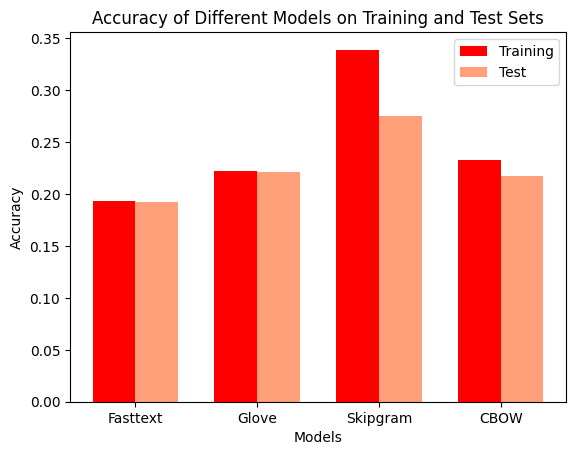

In [96]:
accuracies_training = [accuracy_fasttext_train, accuracy_glove_train, accuracy_sg_train, accuracy_cbow_train]
accuracies_test = [accuracy_fasttext, accuracy_glove, accuracy_sg, accuracy_cbow]
models = ['Fasttext', 'Glove', 'Skipgram', 'CBOW']

bar_width = 0.35

indices_training = np.arange(len(models))
indices_test = indices_training + bar_width

plt.bar(indices_training, accuracies_training, width=bar_width, label='Training', color='red')
plt.bar(indices_test, accuracies_test, width=bar_width, label='Test', color= 'lightsalmon')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy of Different Models on Training and Test Sets')
plt.xticks(indices_training + bar_width / 2, models)
plt.legend()

plt.show()



#### Training time for each model:

In [97]:
print(f"Training time for the cbow model: {cbow_training_time} seconds")
print(f"Training time for the skip gram model: {sg_training_time} seconds")
print(f"Training time for the glove model: {glove_training_time} seconds")
print(f"Training time for the fasttext model: {fasttext_training_time} seconds")


Training time for the cbow model: 41.30016303062439 seconds
Training time for the skip gram model: 25.552555322647095 seconds
Training time for the glove model: 38.292391538619995 seconds
Training time for the fasttext model: 56.349398612976074 seconds


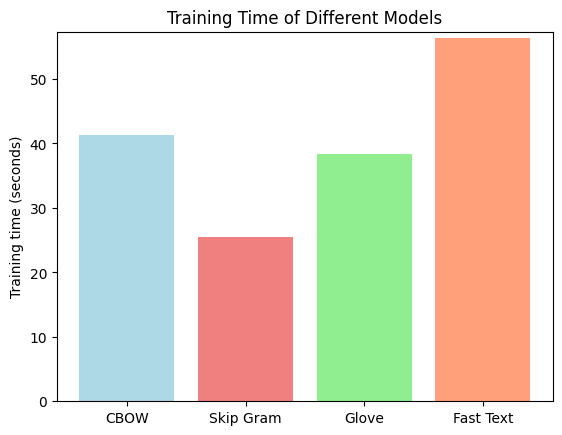

In [98]:
training_time = [cbow_training_time, sg_training_time, glove_training_time,fasttext_training_time]
models = ['CBOW', 'Skip Gram', 'Glove','Fast Text']

plt.bar(models, training_time, color=['lightblue', 'lightcoral', 'lightgreen', 'lightsalmon'])
plt.ylabel('Training time (seconds)')
plt.title('Training Time of Different Models')
plt.ylim(0, max(training_time) + 1) 
plt.show()

### Training CBOW or Skip Gram from scratch

#### generate context-target pairs

In [1]:
import pandas as pd
import numpy as np
df_c=pd.read_csv('spooky_for_cbow.csv')
df_c=df_c.drop(columns=['id','author'],axis=0)
df_c.head()

,text
0,process however afforded means ascertaining di...
1,never occurred fumbling might mere mistake
2,left hand gold snuff box capered hill cutting ...
3,lovely spring looked windsor terrace sixteen f...
4,finding nothing else even gold superintendent ...


In [2]:
df_np=df_c.values

In [3]:
df_np

array([['process however afforded means ascertaining dimensions dungeon might make circuit return point whence set without aware fact perfectly uniform seemed wall'],
       ['never occurred fumbling might mere mistake'],
       ['left hand gold snuff box capered hill cutting manner fantastic steps took snuff incessantly air greatest possible self satisfaction'],
       ...,
       ['mais il faut agir say frenchman never faints outright'],
       ['item news like strikes us coolly received'],
       ['laid gnarled claw shoulder seemed shaking altogether mirth']],
      dtype=object)

In [4]:
# Tokenize the text
words = [word.lower() for sentence_list in df_np for sentence in sentence_list if pd.notna(sentence) for word in sentence.split()]
# Create vocabulary
vocab = list(set(words))
word_to_idx = {word: idx for idx, word in enumerate(vocab)}
idx_to_word = {idx: word for idx, word in enumerate(vocab)}

In [5]:
nbr_words=len(words)

In [6]:
word_to_idx

{'curiously': 0,
 'georges': 1,
 'torrent': 2,
 'jostled': 3,
 'bobolink': 4,
 'evinces': 5,
 'tyrant': 6,
 'dig': 7,
 'bonnet': 8,
 'magnificence': 9,
 'intertwining': 10,
 'slavered': 11,
 'journies': 12,
 'slipping': 13,
 'galloped': 14,
 'dampness': 15,
 'avocations': 16,
 'employ': 17,
 'october': 18,
 'personage': 19,
 'retarded': 20,
 'workmanship': 21,
 'foundation': 22,
 'gout': 23,
 'cheerily': 24,
 'hyena': 25,
 'vaultings': 26,
 'industrious': 27,
 'suavity': 28,
 'gerrits': 29,
 'verdant': 30,
 'sunken': 31,
 'subjective': 32,
 'improbability': 33,
 'sea': 34,
 'level': 35,
 'maskers': 36,
 'summoned': 37,
 'sepulture': 38,
 'fled': 39,
 'burns': 40,
 'duelling': 41,
 'magic': 42,
 'sobs': 43,
 'nebber': 44,
 'ant': 45,
 'beavers': 46,
 'explored': 47,
 'need': 48,
 'serious': 49,
 'gittin': 50,
 'advantageous': 51,
 'powerfully': 52,
 'scientific': 53,
 'royalty': 54,
 'round': 55,
 'canopies': 56,
 'oscar': 57,
 'italicus': 58,
 'uninquiring': 59,
 'maiming': 60,
 'victo

In [7]:
# Function to initialize parameters
def initialize_parameters(vocab_size, embedding_size):
    W1 = np.random.randn(vocab_size, embedding_size) *0.01
    W2 = np.random.randn(embedding_size,vocab_size,)  *0.01
    return W1, W2
# Softmax function
def softmax(x):
    exp_x = np.exp(x - np.max(x))
    return exp_x / np.sum(exp_x)
def forward_pass(context, parameters):
    W1, W2 = parameters
    h = np.dot(context, W1)
    u = np.dot(h, W2)
    y_pred = softmax(u)
    return h, u, y_pred


def backward_pass(context, y_pred, target,h,u ,parameters):
    W1, W2 = parameters
    target = target.reshape(y_pred.shape)
    dy = y_pred - target
    dW2 = np.dot(h.T,dy* (softmax(u) * (1 - softmax(u))))
    dh = np.dot(dy * (softmax(u) * (1 - softmax(u))), W2.T)
    dW1 = np.dot(context.T, dh)
    learning_rate = 0.01
    W1 -= learning_rate * dW1
    W2 -= learning_rate * dW2

    return W1, W2

# One-hot encode the context
def one_hot_encode(context_indices, vocab_size):
    context_one_hot = np.zeros((1, vocab_size))
    context_one_hot[0, context_indices] = 1
    return context_one_hot



In [8]:
for sentence in df_np:
            words = [word for sentence_list in sentence if pd.notna(sentence_list) for word in sentence_list.split()  ] 
            print('words',words)
            for i in range(2, len(words) - 2):
                # Extract context and target for the current training sample
                context = words[i - 2:i] + words[i + 1:i + 2 + 1]
                print('context',context)
                target = words[i]
                print('target',target)



words ['process', 'however', 'afforded', 'means', 'ascertaining', 'dimensions', 'dungeon', 'might', 'make', 'circuit', 'return', 'point', 'whence', 'set', 'without', 'aware', 'fact', 'perfectly', 'uniform', 'seemed', 'wall']
context ['process', 'however', 'means', 'ascertaining']
target afforded
context ['however', 'afforded', 'ascertaining', 'dimensions']
target means
context ['afforded', 'means', 'dimensions', 'dungeon']
target ascertaining
context ['means', 'ascertaining', 'dungeon', 'might']
target dimensions
context ['ascertaining', 'dimensions', 'might', 'make']
target dungeon
context ['dimensions', 'dungeon', 'make', 'circuit']
target might
context ['dungeon', 'might', 'circuit', 'return']
target make
context ['might', 'make', 'return', 'point']
target circuit
context ['make', 'circuit', 'point', 'whence']
target return
context ['circuit', 'return', 'whence', 'set']
target point
context ['return', 'point', 'set', 'without']
target whence
context ['point', 'whence', 'without', 'a

target trees
context ['scenes', 'trees', 'vernal', 'ambrosial']
target ever
context ['trees', 'ever', 'ambrosial', 'air']
target vernal
context ['ever', 'vernal', 'air', 'rests']
target ambrosial
context ['vernal', 'ambrosial', 'rests', 'perpetual']
target air
context ['ambrosial', 'air', 'perpetual', 'glow']
target rests
context ['air', 'rests', 'glow', 'stamped']
target perpetual
context ['rests', 'perpetual', 'stamped', 'form']
target glow
context ['perpetual', 'glow', 'form', 'tempest']
target stamped
context ['glow', 'stamped', 'tempest', 'wildest']
target form
context ['stamped', 'form', 'wildest', 'uproar']
target tempest
context ['form', 'tempest', 'uproar', 'universal']
target wildest
context ['tempest', 'wildest', 'universal', 'nature']
target uproar
context ['wildest', 'uproar', 'nature', 'encaged']
target universal
context ['uproar', 'universal', 'encaged', 'narrow']
target nature
context ['universal', 'nature', 'narrow', 'frame']
target encaged
context ['nature', 'encaged'

In [9]:
# Convert words to indices
context_indices = np.array([word_to_idx[word] for word in context])
print('context_indices',context_indices)
context_indices= one_hot_encode(context_indices, len(vocab))

target_index = word_to_idx[target]
print('target_index',target_index)
print(np.sum(context_indices))
target_one_hot = np.zeros(len(vocab))
target_one_hot[target_index] = 1
print('target_onehot',target_one_hot)
print(np.sum(target_one_hot))



context_indices [  188  8296 10666   724]
target_index 9410
4.0
target_onehot [0. 0. 0. ... 0. 0. 0.]
1.0


In [10]:
def plot_training_progress(loss_history):
    plt.figure(figsize=(12, 4))

    plt.plot(loss_history, label='Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()



In [11]:
def train_cbow(data, vocab_size, embedding_size, context_window_size, learning_rate, epochs):
    # Initialize parameters
    W1, W2 = initialize_parameters(vocab_size, embedding_size)
    loss_history = []
    accuracy_history = []

    for epoch in range(epochs):
        total_loss = 0.0
        correct_predictions = 0

        for sentence in data:
            words = [word for sentence_list in sentence if pd.notna(sentence_list) for word in sentence_list.split()]

            for i in range(context_window_size, len(words) - context_window_size):
                # Extract context and target for the current training sample
                context = words[i - context_window_size:i] + words[i + 1:i + context_window_size + 1]
                target = words[i]

                # Convert words to indices
                context_indices = np.array([word_to_idx[word] for word in context])
                context_indices = one_hot_encode(context_indices, W1.shape[0])

                target_index = word_to_idx[target]

                # One-hot encode the target
                target_one_hot = np.zeros(vocab_size)
                target_one_hot[target_index] = 1

                # Forward pass
                h, u, y_pred = forward_pass(context_indices, (W1, W2))


                # Backward pass
                W1, W2 = backward_pass(context_indices, y_pred, target_one_hot, h, u, (W1, W2))
                # Calculate loss
                loss = -np.sum(np.log(y_pred[0, target_index]))
                total_loss += loss
                # Calculate accuracy
        # Calculate average loss and accuracy for the epoch
        average_loss = total_loss / (nbr_words - (2 * context_window_size))
        print(f"Epoch {epoch + 1}/{epochs}, Average Loss: {average_loss}")

        loss_history.append(average_loss)

    # Plot the training progress
    plot_training_progress(loss_history, accuracy_history)

In [12]:
# Example usage
vocab_size = len(vocab)
embedding_size = 20
context_window_size = 2
learning_rate = 0.1
epochs = 10

In [13]:
train_cbow(df_np, vocab_size, embedding_size, context_window_size, learning_rate, epochs)

Epoch 1/10, Average Loss: 7.107563793336682
Epoch 2/10, Average Loss: 7.107563787073859
Epoch 3/10, Average Loss: 7.1075637808110015
Epoch 4/10, Average Loss: 7.107563774548309
Epoch 5/10, Average Loss: 7.107563768285661
Epoch 6/10, Average Loss: 7.107563762022724
Epoch 7/10, Average Loss: 7.107563755760162
Epoch 8/10, Average Loss: 7.107563749497442
Epoch 9/10, Average Loss: 7.10756374323463
